In [1]:
!pip install clipscope
!pip install datasets

In [2]:
import datasets
import PIL
from clipscope import ConfiguredViT, TopKSAE
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [3]:
# we pick an easy-to-download image dataset from huggingface at random. Food images in this case.
ds = datasets.load_dataset("ethz/food101", split="validation")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:90: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [4]:
ds

Dataset({
    features: ['image', 'label'],
    num_rows: 25250
})

In [5]:
# ok what does a sample look like?
for sample in ds:
  print(sample)
  break

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=512x512 at 0x7E441D837BE0>, 'label': 6}


In [6]:
# load the model and the sparse autoencoder
device='cuda'
filename_in_hf_repo = "22_resid/1200013184.pt"
sae = TopKSAE.from_pretrained(checkpoint=filename_in_hf_repo, device=device)

locations = [(22, 'resid')]
transformer = ConfiguredViT(locations, device=device)

1200013184.pt:   0%|          | 0.00/537M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.58k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/275 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [7]:
# accumulate latents for 800 samples
latents = None
count = 0

dl = DataLoader(ds, batch_size=8, shuffle=False, num_workers=1, collate_fn=lambda x: [[y['image'] for y in x], [y['label'] for y in x]])
for sample in dl:
  activations = transformer.all_activations(sample[0])[locations[0]][:, 0]
  output = sae.forward_verbose(activations)
  if latents is None:
    latents = output['latent']
  else:
    latents = torch.cat((latents, output['latent']), dim=0)
  count += 1

  if count == 100:
    break

print(latents.shape)
# since we did not shuffle latents[0] will now correspond to ds[0]

torch.Size([800, 65536])


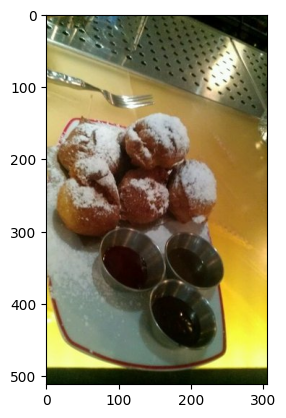

In [8]:
# yup, you can index the dataset and get specific images. nice
plt.imshow(ds[10]['image'])

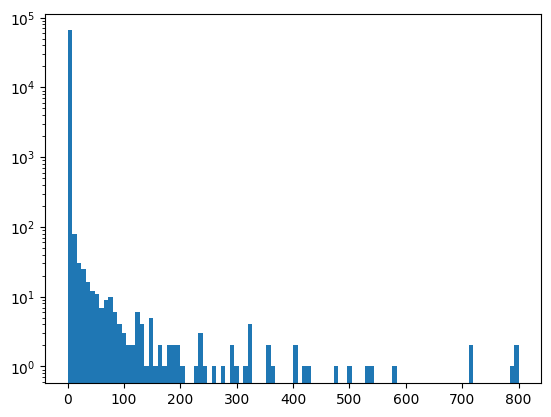

In [9]:
# get a feel for how many latents are active.
n_active = torch.sum(latents > 0, dim=0)

plt.hist(n_active.cpu().numpy(), bins=100)
plt.yscale('log')

# Most of the latents are always inactive, we would expect this (unless we thought the sparse autoencoder only learned about food).
# But a lot of latents seem to be active 10%-70% of the time, and 6-8 of them seem like they are always active.
# Would be interesting to dig deeper into what is going on here at some point...

In [10]:
# we select all features which activate more than 100 times across these 800 samples
frequent_feature_idx = torch.nonzero(n_active > 100)[:, 0]
print('number of frequent features', frequent_feature_idx.shape)

# then we get the indices of the top 9 images which activate the most these features
wanted = latents[:, frequent_feature_idx]
top_activating_images = torch.topk(wanted, 9, dim=0).indices.T
print(top_activating_images.shape)

number of frequent features torch.Size([63])
torch.Size([63, 9])


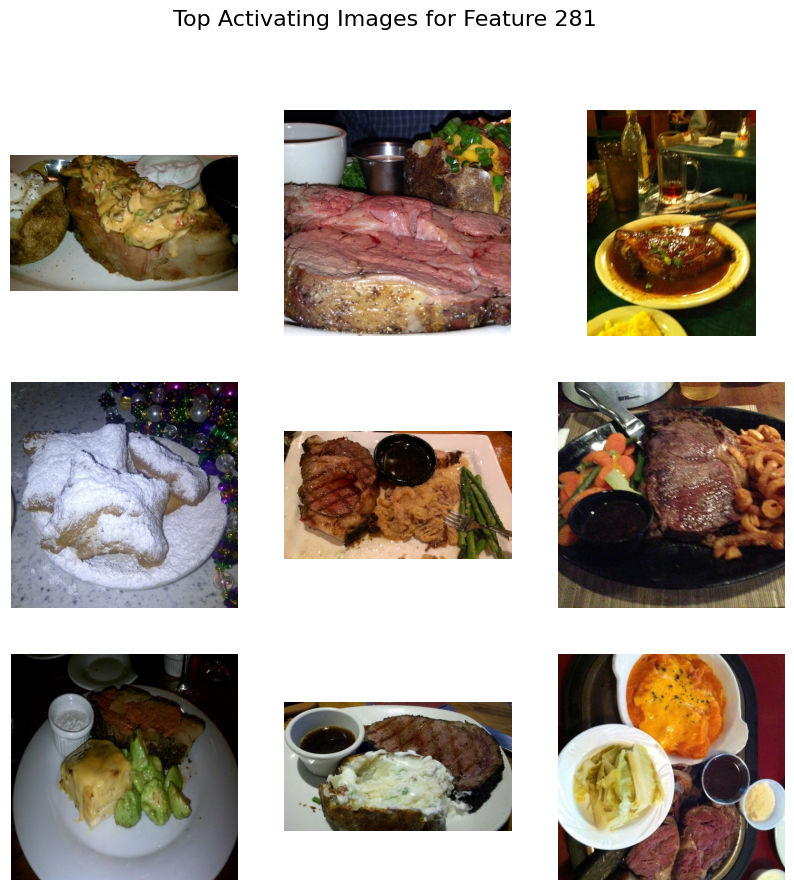

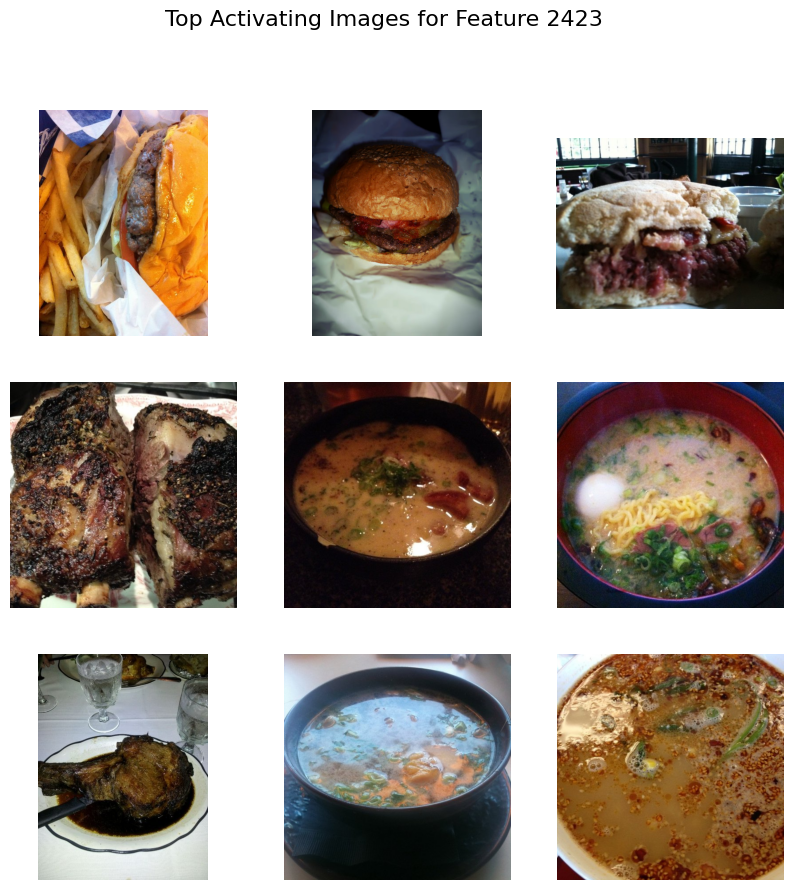

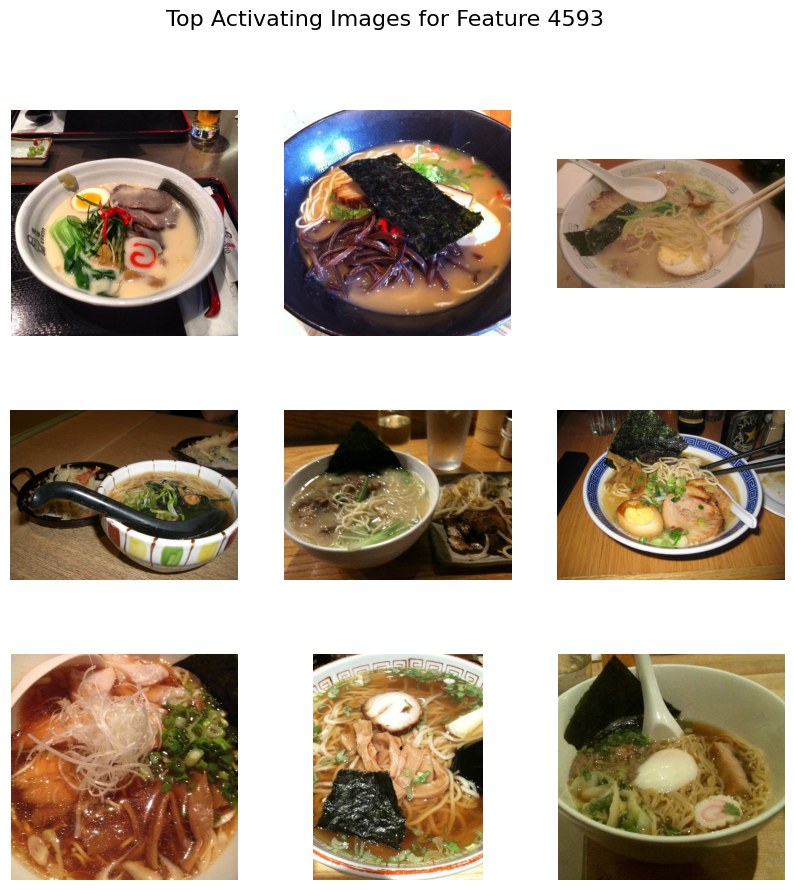

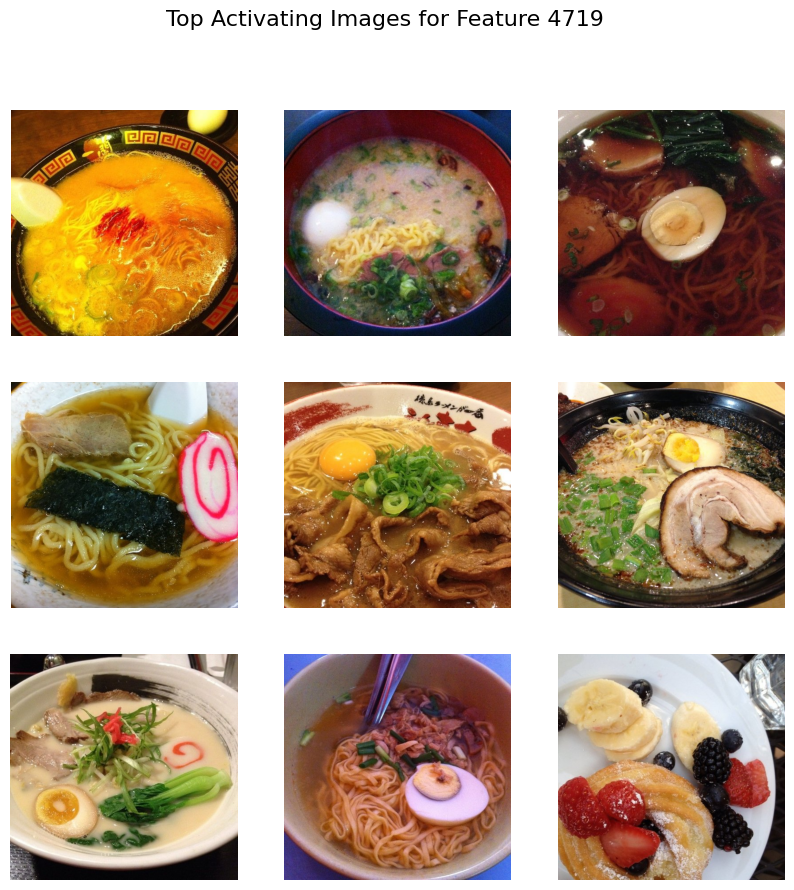

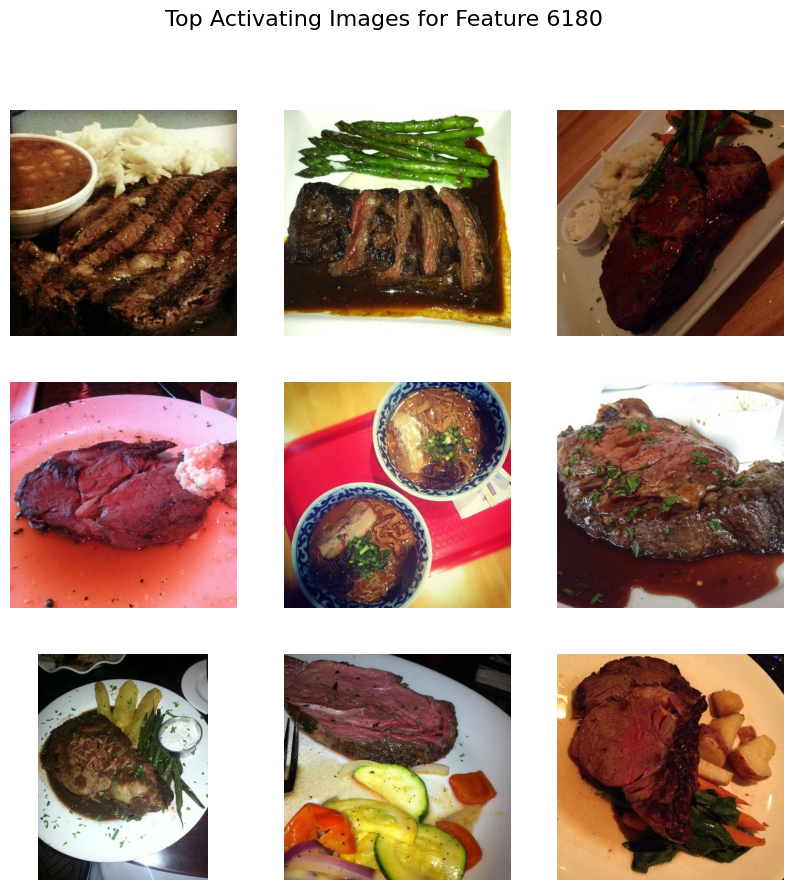

...

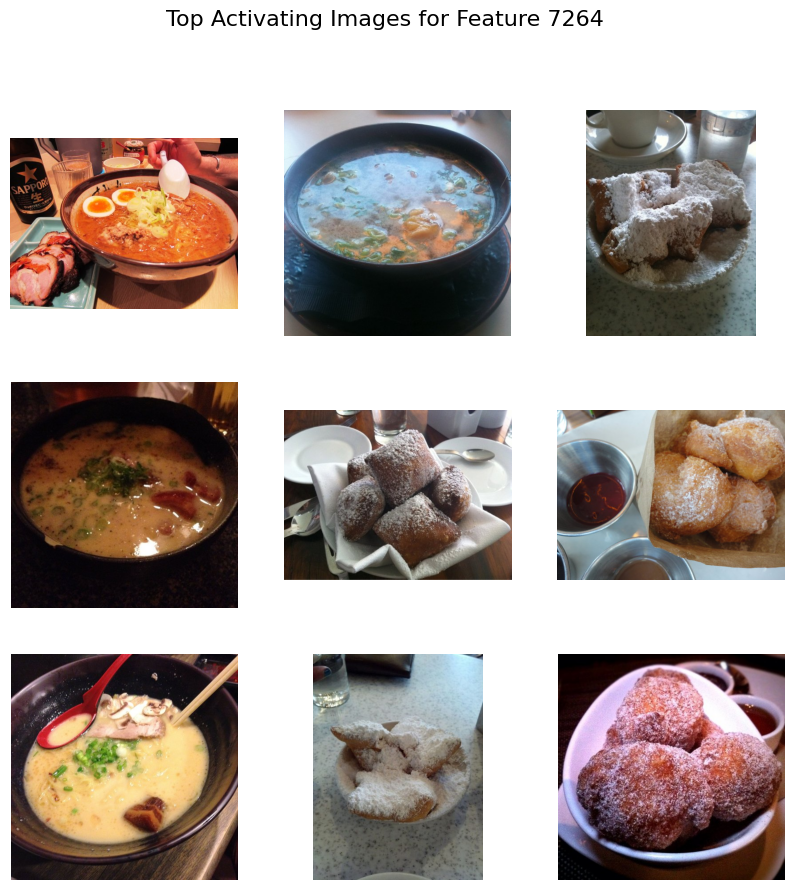

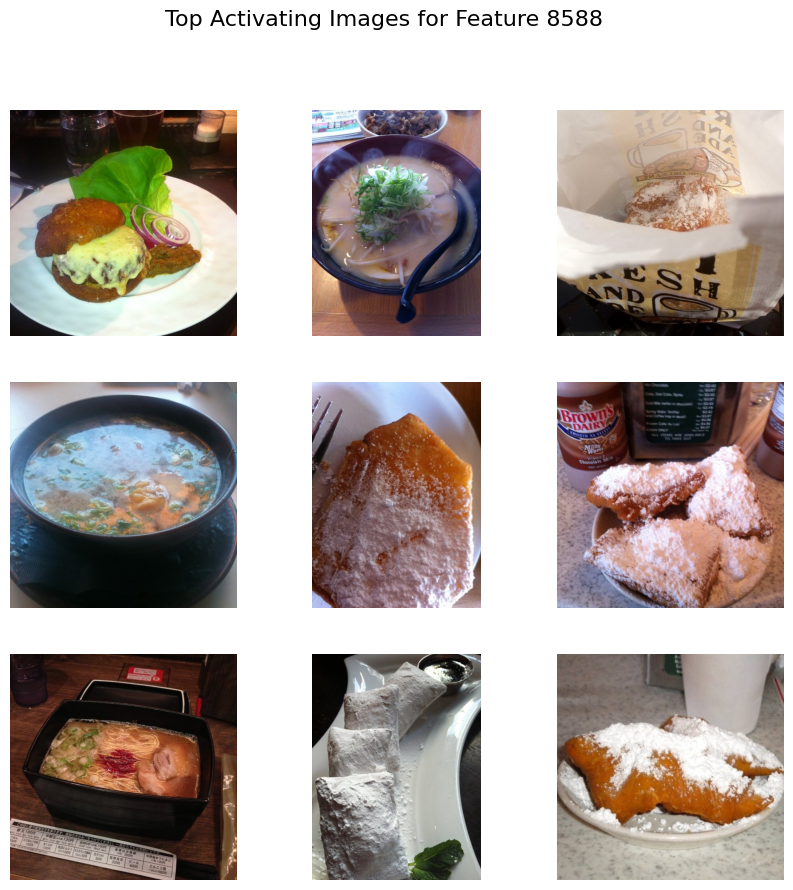

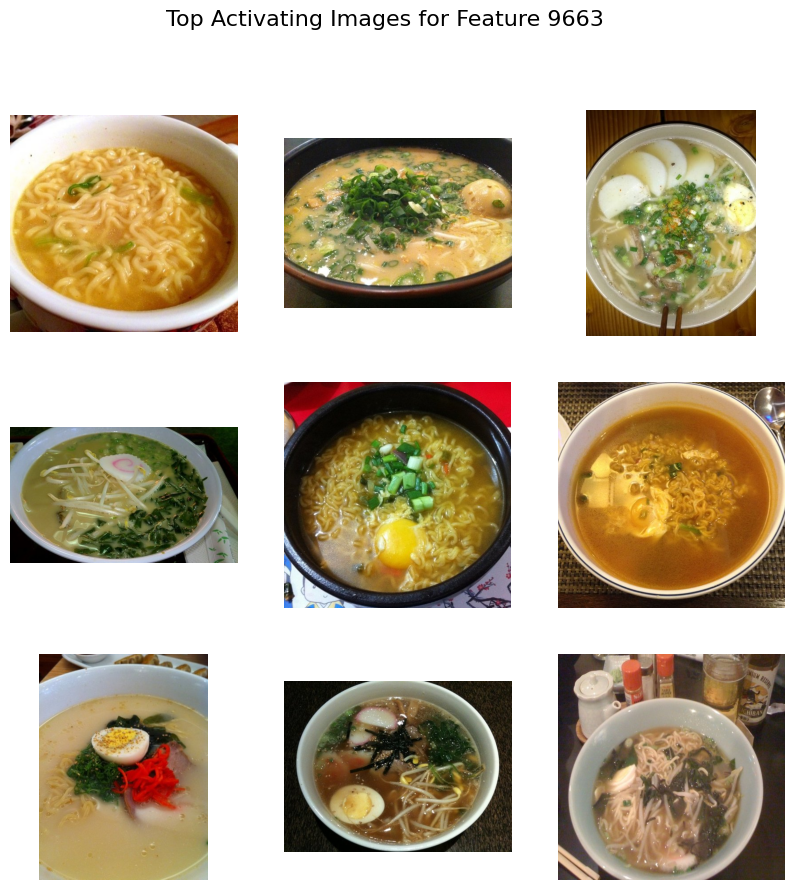

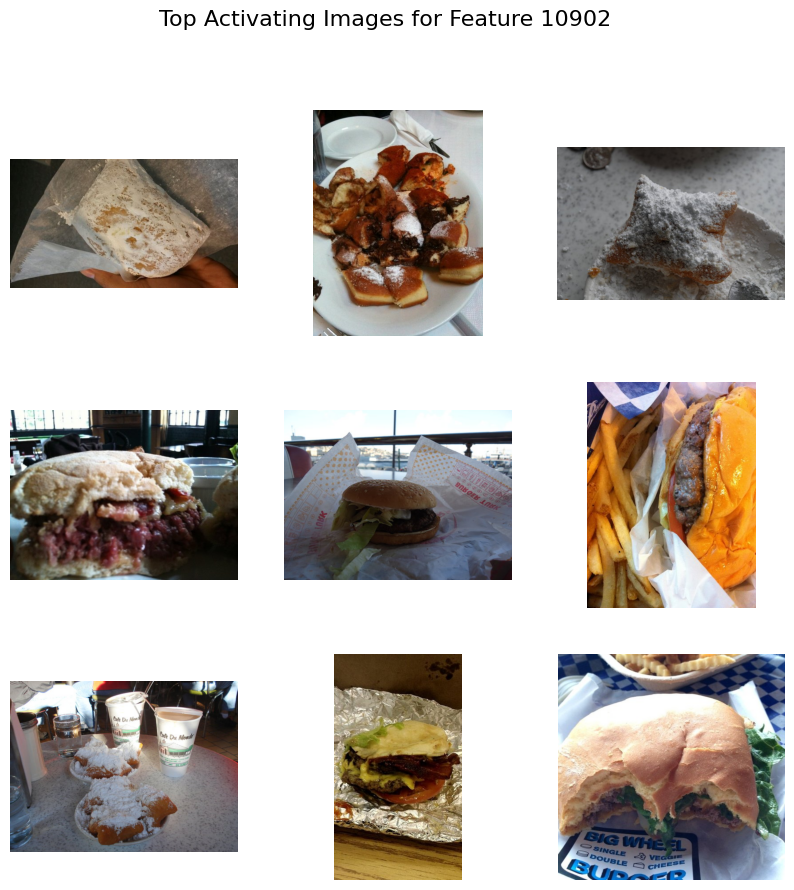

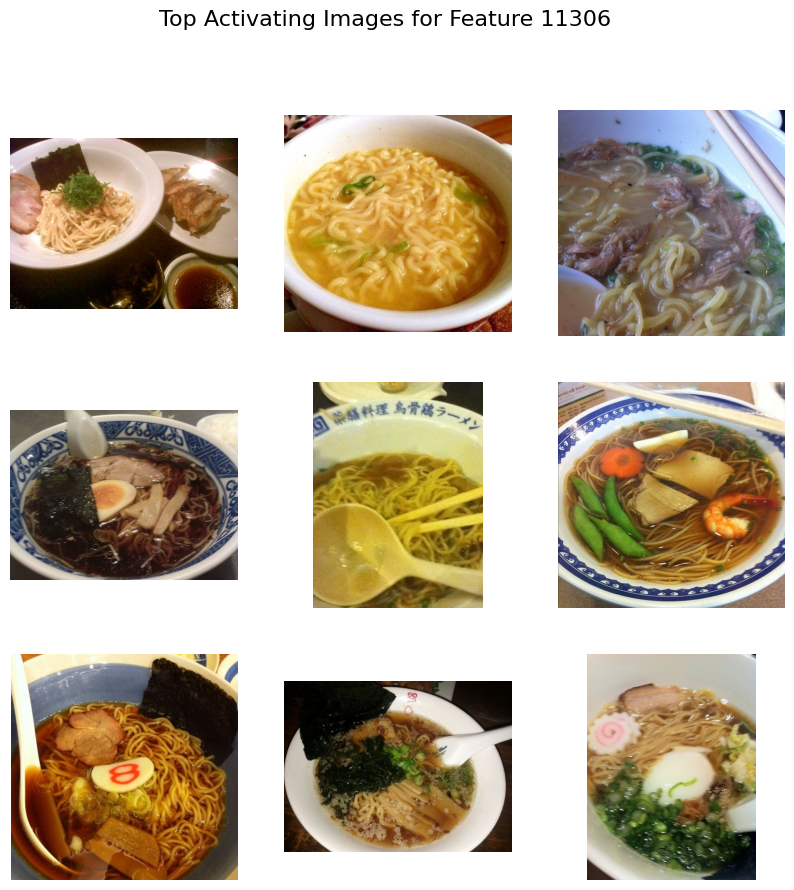

In [11]:
def plot_top_activating_images(top_activating_images, feature_indices, ds, up_to=10):
    for i in range(top_activating_images.shape[0]):
        img_indices = top_activating_images[i].tolist()

        fig, axes = plt.subplots(3, 3, figsize=(10, 10))

        for ax, img_idx in zip(axes.flat, img_indices):
            pil_img = ds[img_idx]['image']

            if not isinstance(pil_img, PIL.Image.Image):
                pil_img = PIL.Image.fromarray(pil_img)

            ax.imshow(pil_img)
            ax.axis('off')  # Hide the axes

        fig.suptitle(f"Top Activating Images for Feature {feature_indices[i]}", fontsize=16)

        plt.show()
        if i == up_to:
          break

# now we plot 3x3 grids for the first 10 of the frequent features
plot_top_activating_images(top_activating_images, frequent_feature_idx, ds)

In [12]:
# seems somewhat monosemantic, you can really tell the difference between the steak, noodle soup and pastry features at least, and this was just over 800 samples.